In [1]:
import requests
import cv2
import os
import sys
import math
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from paddleocr import draw_ocr

/Users/volpea/.local/pipx/venvs/notebook/lib/python3.12/site-packages/paddle/utils/cpp_extension/extension_utils.py:686: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)


In [2]:
sys.path.append(os.path.abspath("../jobs"))

In [3]:
from sample_generation.image_utils import denormalise_box_coordinates

### Read Sample and Boxes from API

In [9]:
document_id = 5

In [14]:
get_samples_url = f"http://localhost:8000/document_app/api/documents/{document_id}/get_samples/"

with requests.Session() as session:
    res_samples = session.get(get_samples_url)

if res_samples.status_code != 200:
    raise ValueError(f"cannot retrieve samples for document: {document_id}")
else:
    samples = res_samples.json()

In [15]:
sample = samples[0]
sample

{'id': 1813,
 'name': 'sample_0',
 'image': '/media/document_samples/sample_0_dPfpTnT.png',
 'template_document': 5}

In [16]:
sample_id = sample["id"]

In [18]:
get_sample_boxes_url = f"http://localhost:8000/document_app/api/sample_documents/{sample_id}/get_boxes/"

with requests.Session() as session:
    res_boxes = session.get(get_sample_boxes_url)

if res_boxes.status_code != 200:
    raise ValueError(f"cannot retrieve boxes for sample: {sample_id}")
else:
    boxes = res_boxes.json()

In [19]:
boxes

[{'id': 3388,
  'name': 'cognome_b',
  'label': 'UBFEVVSRO',
  'start_x_norm': 0.8159420289855073,
  'start_y_norm': 0.16407766990291262,
  'end_x_norm': 0.9666666666666667,
  'end_y_norm': 0.18058252427184465,
  'sample_document': 1813,
  'template_box': 19},
 {'id': 3389,
  'name': 'cognome',
  'label': 'NLIQ',
  'start_x_norm': 0.24202898550724639,
  'start_y_norm': 0.16407766990291262,
  'end_x_norm': 0.3101449275362319,
  'end_y_norm': 0.18155339805825244,
  'sample_document': 1813,
  'template_box': 18}]

In [21]:
with requests.Session() as session:
    res_image = session.get("http://localhost:8000/" + sample["image"])

if res_image.status_code == 200:
    sample_image = np.frombuffer(image.content, np.uint8)
    sample_image = cv2.imdecode(sample_image, cv2.IMREAD_COLOR)
else:
    raise ValueError(f"could not retrieve the image error: {res_image.status_code}")

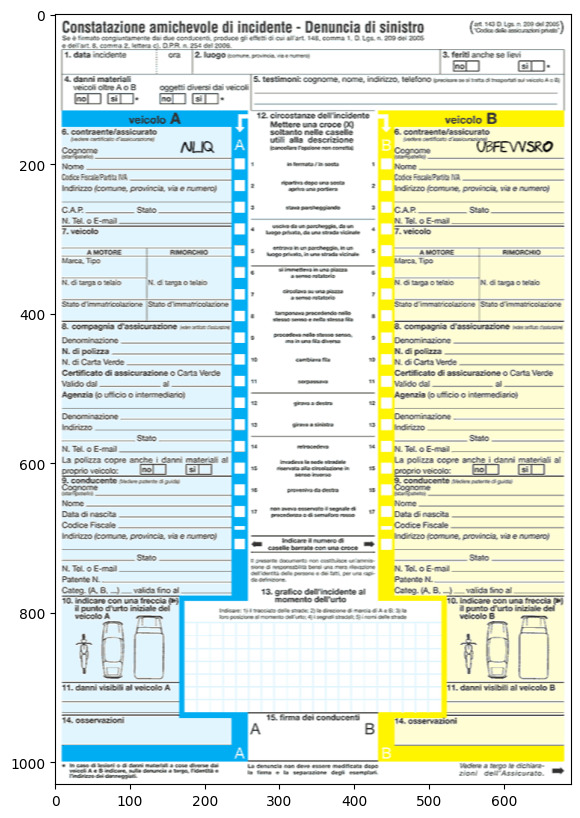

In [22]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
plt.show()

In [23]:
doc_height = sample_image.shape[0]
doc_width = sample_image.shape[1]

In [24]:
box_coords = []

for box in boxes:
    start_x, start_y, end_x, end_y = denormalise_box_coordinates(box["start_x_norm"], box["start_y_norm"], 
                                                                 box["end_x_norm"], box["end_y_norm"],
                                                                 doc_width=doc_width, doc_height=doc_height)

    box_coords.append([[start_x, start_y], [end_x, start_y], [end_x, end_y], [start_x, end_y]])

In [25]:
box_coords

[[[563, 169], [667, 169], [667, 186], [563, 186]],
 [[167, 169], [214, 169], [214, 187], [167, 187]]]

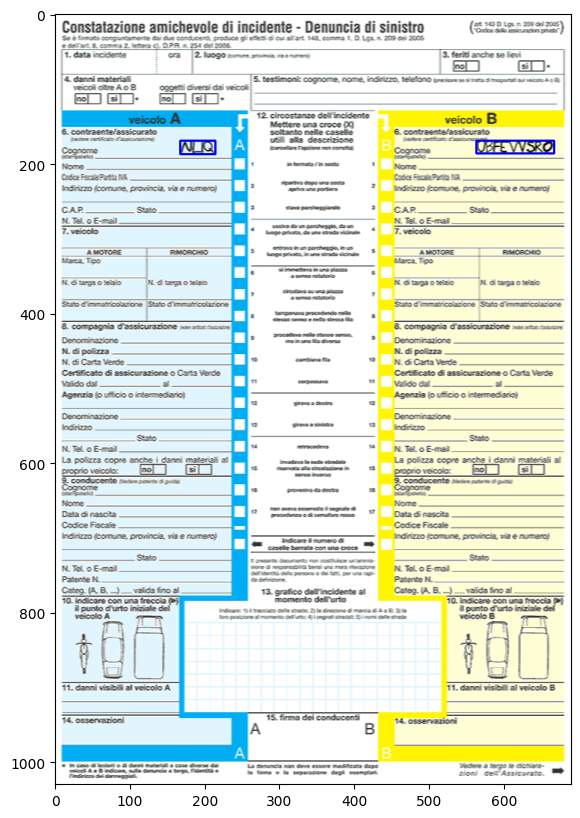

In [26]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(draw_ocr(sample_image, box_coords), cv2.COLOR_BGR2RGB))
plt.show()

### Apply Degradations

In [32]:
from sample_generation.image_degradations import *

#### gaussian blur

In [33]:
image_gaussian_blur = gaussian_blur(sample_image, kernel_size=3)

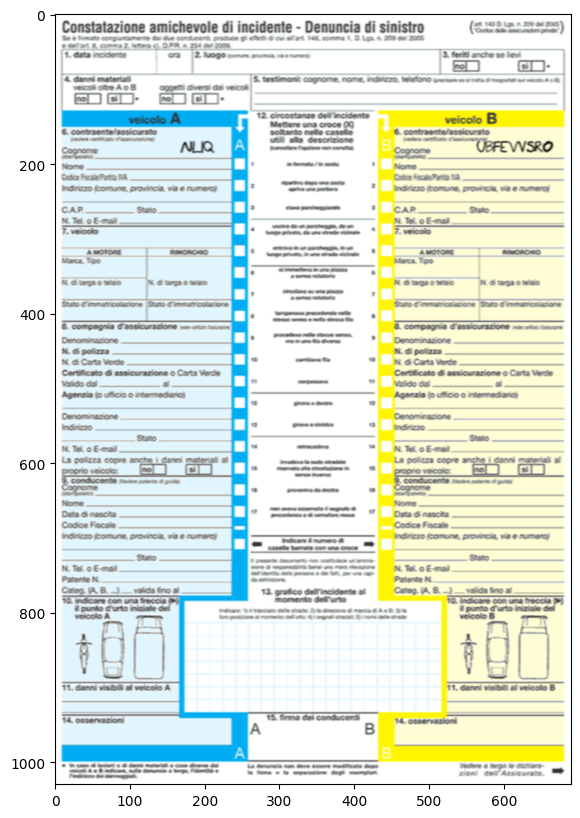

In [34]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(image_gaussian_blur, cv2.COLOR_BGR2RGB))
plt.show()

#### motion blur

In [35]:
image_motion_blur = motion_blur(sample_image, kernel_size=5)

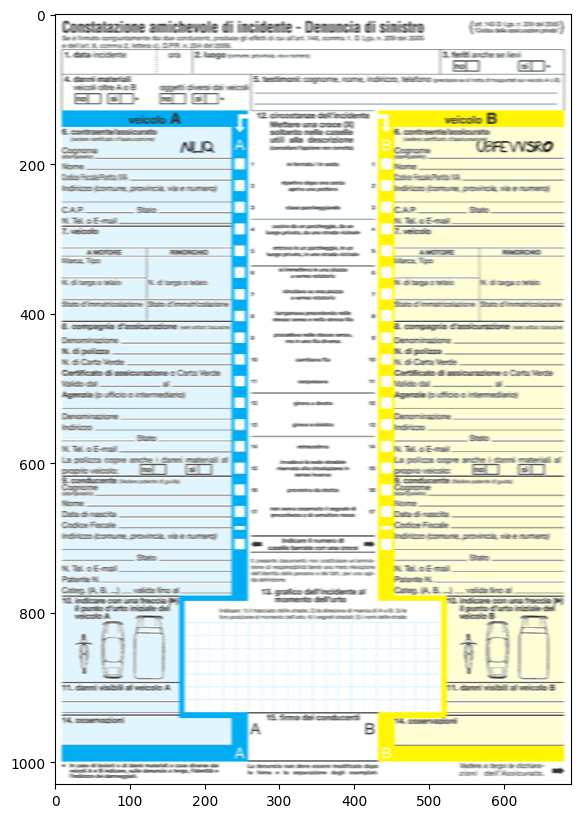

In [36]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(image_motion_blur, cv2.COLOR_BGR2RGB))
plt.show()

#### gaussian noise

In [39]:
image_gaussian_noise = gaussian_noise(sample_image, mean=0, std=0.9)

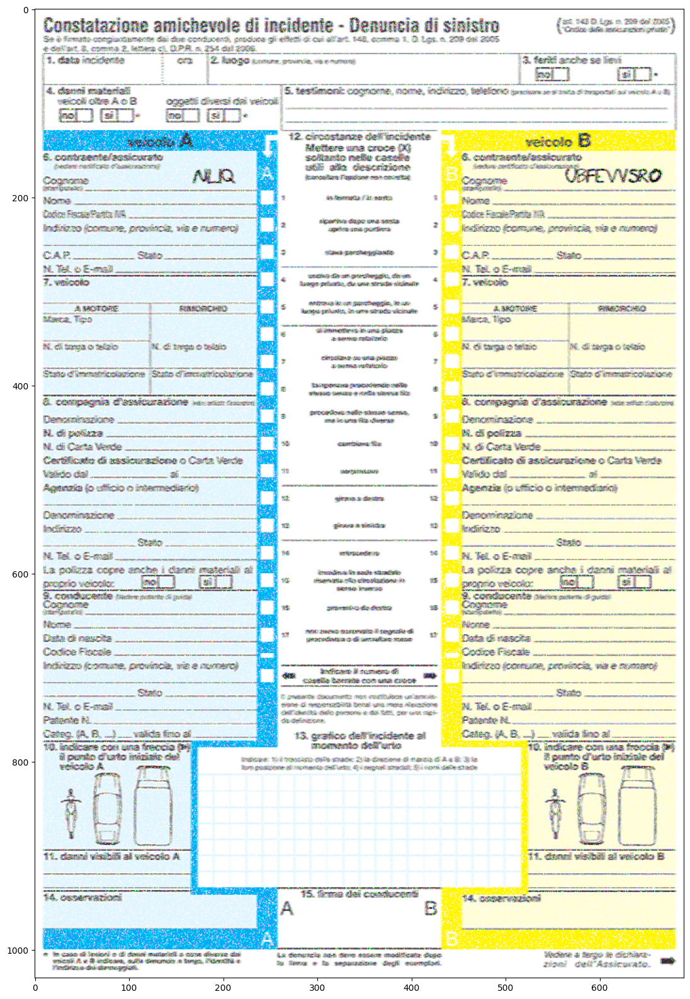

In [40]:
plt.figure(figsize=(30, 20))
plt.imshow(cv2.cvtColor(image_gaussian_noise, cv2.COLOR_BGR2RGB))
plt.show()

#### salt and pepper noise

In [42]:
image_salt_pepper_noise = salt_pepper_noise(sample_image, prob=0.01)

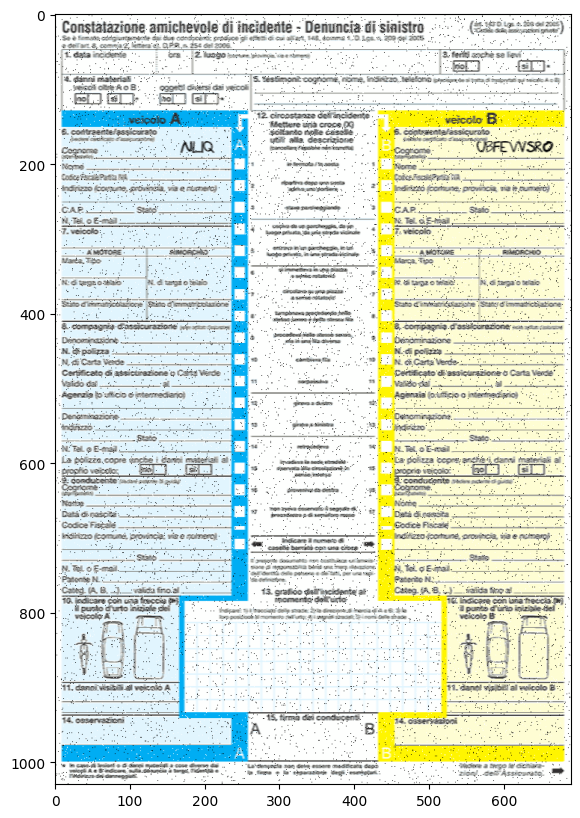

In [43]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(image_salt_pepper_noise, cv2.COLOR_BGR2RGB))
plt.show()

#### brightness and contrast

In [1095]:
new_image_brightness_contrast = change_brightness_and_contrast(sample_image, alpha=1, beta=0)

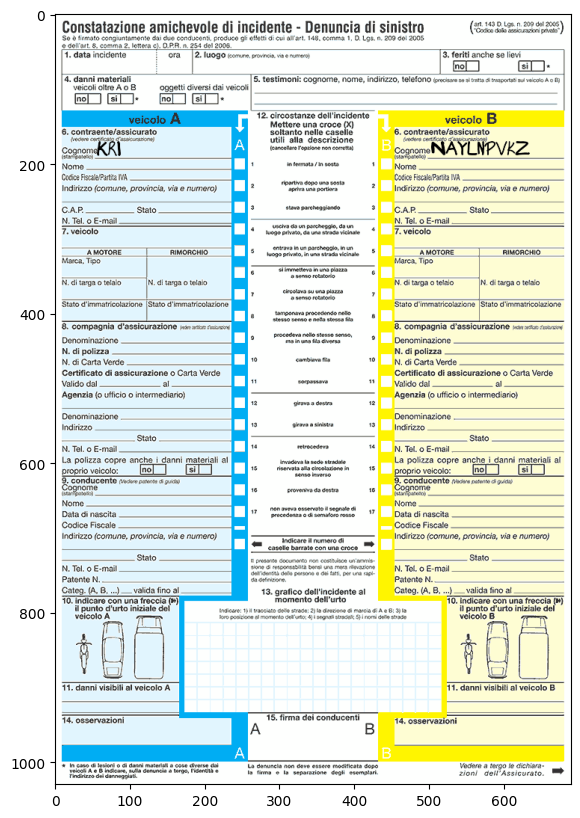

In [1096]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(new_image_brightness_contrast, cv2.COLOR_BGR2RGB))
plt.show()

#### distortion and warping

TODO recalculate box locations

In [209]:
distorted_image = distortion_and_warping(sample_image)

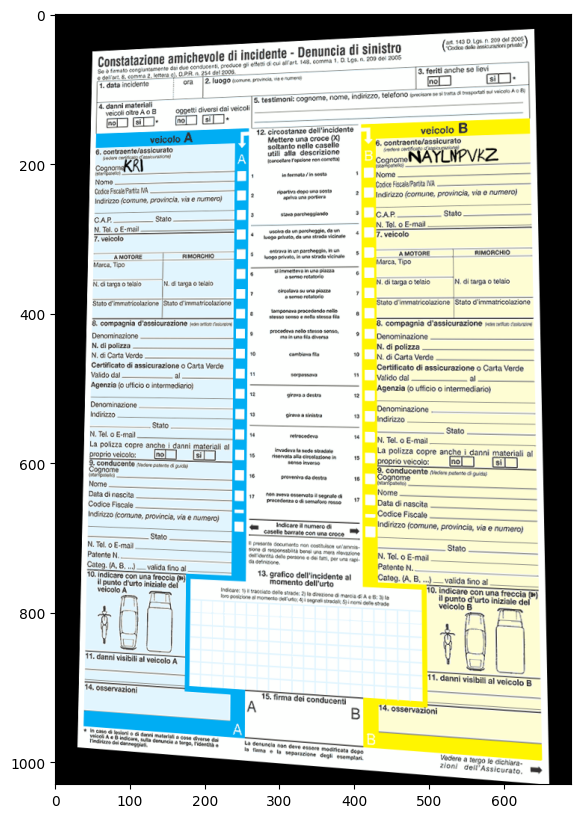

In [210]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(distorted_image, cv2.COLOR_BGR2RGB))
plt.show()

In [285]:
rows, cols, _ = sample_image.shape
src_points = np.float32([[100, 100], [110, 100], [100, 110], [110, 110]])
dst_points = np.float32([[50, 50], [60, 50], [50, 60], [60, 60]])

In [286]:
src_points

array([[100., 100.],
       [110., 100.],
       [100., 110.],
       [110., 110.]], dtype=float32)

In [287]:
dst_points

array([[50., 50.],
       [60., 50.],
       [50., 60.],
       [60., 60.]], dtype=float32)

In [288]:
matrix = cv2.getPerspectiveTransform(src_points, dst_points)

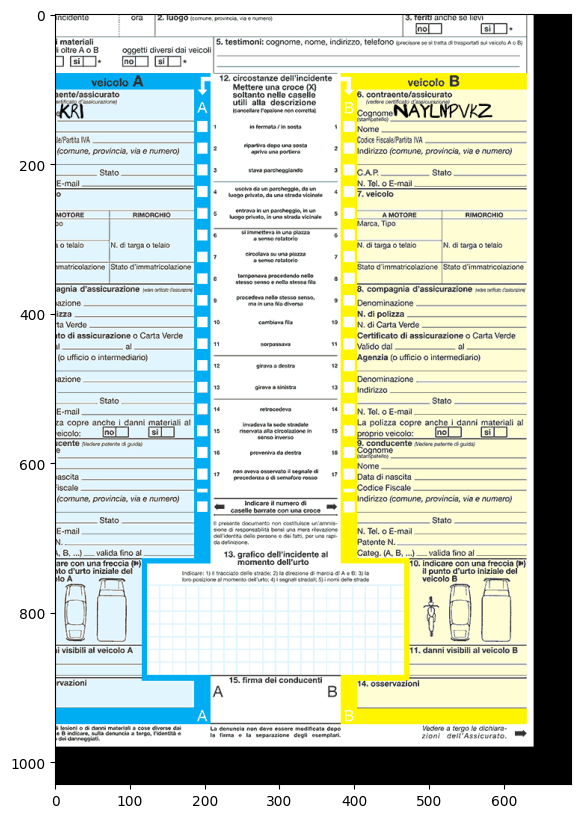

In [289]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(cv2.warpPerspective(sample_image, matrix, (cols, rows)), cv2.COLOR_BGR2RGB))
plt.show()

#### wave distortion

In [988]:
distorted_image, new_boxes = wave_distortion(sample_image, box_coords, amplitude=5, frequency=0.005)

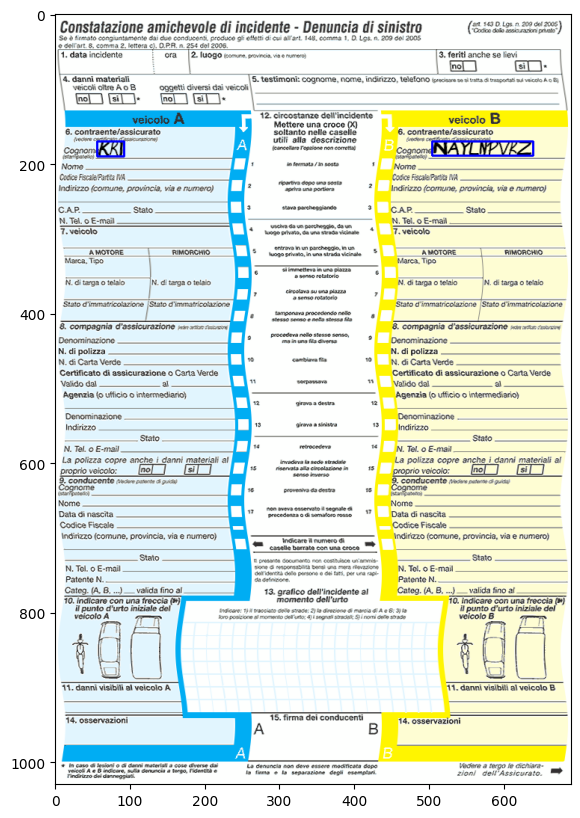

In [990]:
plt.figure(figsize=(20, 10))
plt.imshow(cv2.cvtColor(draw_ocr(distorted_image, new_boxes), cv2.COLOR_BGR2RGB))
plt.show()

### Apply Random Degradations

In [326]:
import random

In [1072]:
degradations = [{"function": gaussian_blur, "parameters": {"kernel_size": np.arange(1, 5, 2)}}, 
                {"function": motion_blur, "parameters": {"kernel_size": np.arange(1, 4, 1)}},
                {"function": gaussian_noise, "parameters": {}},
                {"function": salt_pepper_noise, "parameters": {"prob": np.arange(0.001, 0.01, 0.001)}},
                {"function": brightness_contrast, "parameters": {"alpha": np.arange(0.8, 1.2, 0.1), 
                                                                 "beta": np.arange(-20, 20, 5)}},
                {"function": wave_distortion, "parameters": {"amplitude": np.arange(1, 5, 1),
                                                             "frequency": np.arange(0.001, 0.009, 0.001)}},
                 ]

n = random.randint(0, len(degradations))

random_degradations = random.sample(degradations, n)

In [1073]:
n, random_degradations

(4,
 [{'function': <function sample_generation.degradation.gaussian_noise(image, mean=0, std=1)>,
   'parameters': {}},
  {'function': <function sample_generation.degradation.salt_pepper_noise(image, prob=0.01)>,
   'parameters': {'prob': array([0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009])}},
  {'function': <function sample_generation.degradation.brightness_contrast(image, alpha=1.2, beta=10)>,
   'parameters': {'alpha': array([0.8, 0.9, 1. , 1.1]),
    'beta': array([-20, -15, -10,  -5,   0,   5,  10,  15])}},
  {'function': <function sample_generation.degradation.gaussian_blur(image, kernel_size=1)>,
   'parameters': {'kernel_size': array([1, 3])}}])

In [1074]:
degradated_image = sample_image

for degradation in random_degradations:
    params = {k: random.choice(v) for k, v in degradation["parameters"].items()}
    print(degradation["function"].__name__)
    print(params)

    if degradation["function"].__name__ == "wave_distortion":
        degradated_image, box_coords = degradation["function"](degradated_image, **params, box_coords=box_coords)
    else:
        degradated_image = degradation["function"](degradated_image, **params)

gaussian_noise
{}
salt_pepper_noise
{'prob': 0.005}
brightness_contrast
{'alpha': 1.1, 'beta': -20}
gaussian_blur
{'kernel_size': 3}


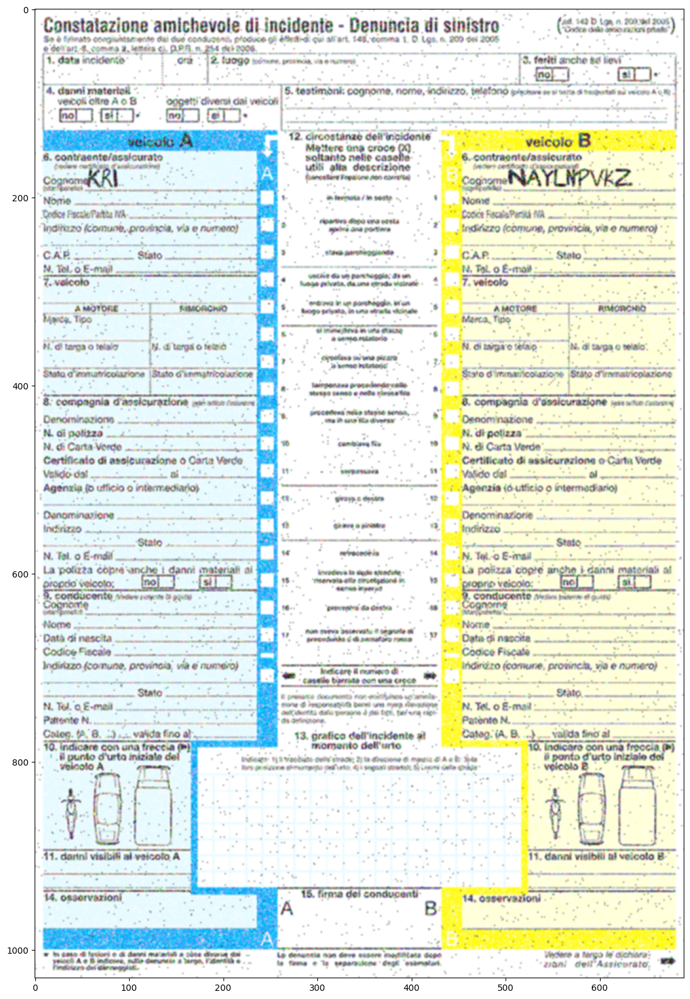

In [1076]:
plt.figure(figsize=(30, 20))
plt.imshow(cv2.cvtColor(degradated_image, cv2.COLOR_BGR2RGB))
plt.show()

### Degradation letters

In [11]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [1]:
handwritten_dataset_processed_base_path = "../data/handwritten_dataset_processed"

In [2]:
ls ../data/handwritten_dataset_processed/images/img025-045.png

../data/handwritten_dataset_processed/images/img025-045.png


In [67]:
letter_image = cv2.imread(f"{handwritten_dataset_processed_base_path}/images/img025-045.png", flags=cv2.IMREAD_GRAYSCALE)

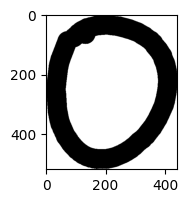

In [68]:
plt.figure(figsize=(5, 2))
plt.imshow(letter_image, cmap='gray')
plt.show()

In [69]:
# Create a binary threshold to ensure pure black and white
_, letter_image = cv2.threshold(letter_image, 127, 255, cv2.THRESH_BINARY_INV)

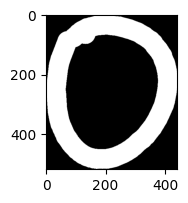

In [29]:
plt.figure(figsize=(5, 2))
plt.imshow(letter_image, cmap='gray')
plt.show()

In [36]:
kernel = np.ones((3, 3), np.uint8) 

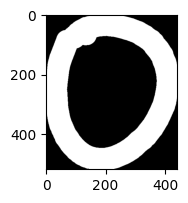

In [37]:
plt.figure(figsize=(5, 2))
plt.imshow(cv2.dilate(letter_image, kernel=kernel, iterations=4), cmap='gray')
plt.show()

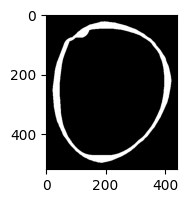

In [42]:
plt.figure(figsize=(5, 2))
plt.imshow(cv2.erode(letter_image, kernel=kernel, iterations=20), cmap='gray')
plt.show()

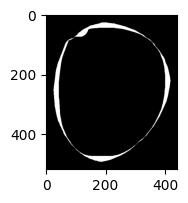

In [55]:
plt.figure(figsize=(5, 2))
plt.imshow(cv2.erode(letter_image, kernel=kernel, iterations=3), cmap='gray')
plt.show()

In [70]:
eroded_letter = cv2.erode(letter_image, kernel=kernel, iterations=20)

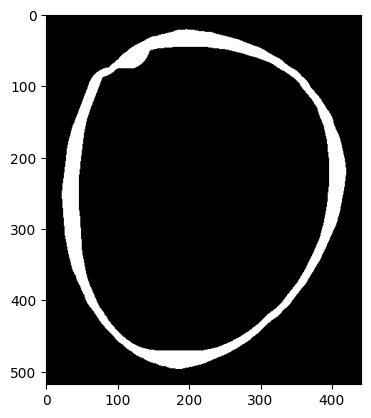

In [71]:
plt.imshow(eroded_letter, cmap="gray")

In [73]:
eroded_letter = cv2.bitwise_not(eroded_letter)

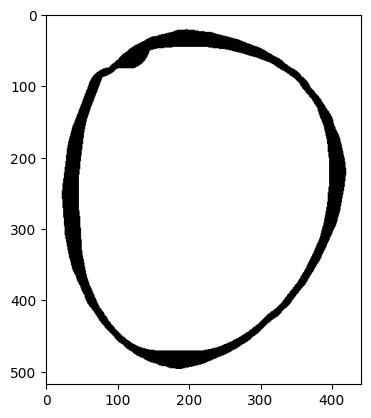

In [74]:
plt.imshow(eroded_letter, cmap="gray")

In [88]:
def apply_gaussian_grayscale(img, mean=128, std_dev=30):
    """
    Apply a Gaussian distribution to letter grayscale intensity on a white background.
    
    Parameters:
    - image_path: Path to the input image
    - mean: Center of the Gaussian distribution (default 128 - middle gray)
    - std_dev: Standard deviation of the Gaussian distribution
    
    Returns:
    - Original binary image
    - Gaussian-distributed grayscale image
    """
    # Create a binary threshold to ensure white background, black letter
    _, binary_img = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
    
    # Create a mask for the letter (zero pixels)
    letter_mask = binary_img == 0
    
    # Create white background image
    gaussian_img = np.full_like(img, 255, dtype=np.float32)
    
    # Apply Gaussian distribution to letter pixels
    if np.any(letter_mask):
        # Generate Gaussian noise
        gaussian_noise = np.random.normal(
            loc=mean, 
            scale=std_dev, 
            size=img.shape
        )
        
        # Apply the noise only to letter pixels
        gaussian_img[letter_mask] = gaussian_noise[letter_mask]
        
        # Clip values to valid grayscale range
        gaussian_img = np.clip(gaussian_img, 0, 255).astype(np.uint8)
    
    # Visualize the results
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.title('Original Binary Image')
    plt.imshow(binary_img, cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.title('Gaussian Distribution Heatmap')
    # Create a heatmap of the Gaussian distribution
    plt.hist(gaussian_img[letter_mask].flatten(), bins=50, density=True, 
             alpha=0.7, color='skyblue')
    x = np.linspace(0, 255, 100)
    plt.plot(x, stats.norm.pdf(x, mean, std_dev), 
             linewidth=2, color='red')
    plt.title('Gaussian Distribution')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Density')
    
    plt.subplot(1, 3, 3)
    plt.title('Gaussian Grayscale Letter')
    plt.imshow(gaussian_img, cmap='gray')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return binary_img, gaussian_img

In [ ]:
[]

In [100]:
np.linspace(0, 100, 101)

array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100.])

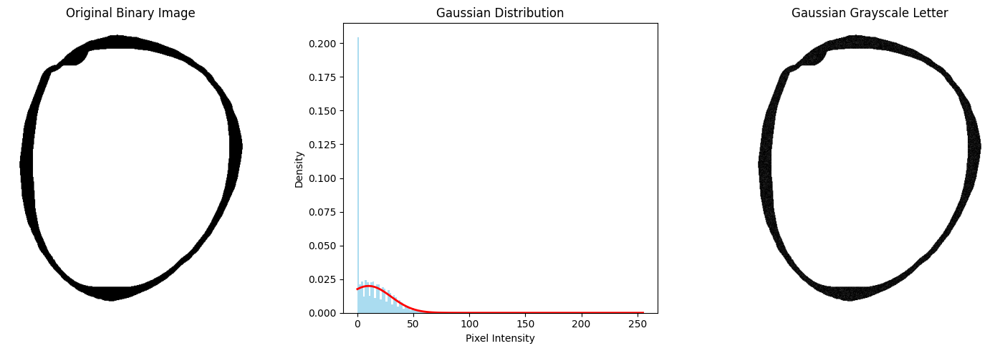

(array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8),
 array([[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255]], dtype=uint8))

In [99]:
apply_gaussian_grayscale(eroded_letter, mean=10, std_dev=20)

### New Degradations

In [45]:
from PIL import Image, ImageFilter, ImageEnhance, ImageOps
import numpy as np
import random
import math

In [49]:
img = Image.fromarray(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))

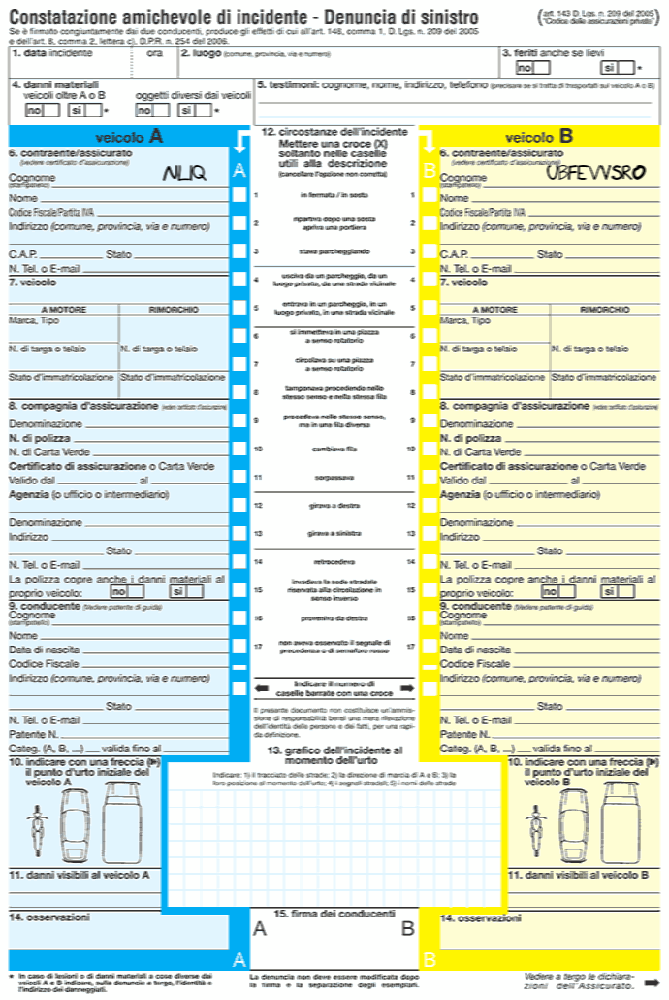

In [50]:
img

In [54]:
def apply_scan_effect(img, intensity=0.7):
    """
    Apply a scan effect to an image to make it look like it was scanned.
    
    Parameters:
    - img: image to apply scan effect to
    - intensity: Controls the strength of the effect (0.0 to 1.0)
    """
    # Open the image
    #img = Image.open(input_path)
    
    # Convert to RGB mode if it's not already
    if img.mode != 'RGB':
        img = img.convert('RGB')
    
    # Step 1: Add slight rotation (paper misalignment)
    angle = random.uniform(-1.5, 1.5) * intensity
    img = img.rotate(angle, expand=True, fillcolor=(255, 255, 255))
    
    # Step 2: Add subtle noise
    img_array = np.array(img)
    noise = np.random.normal(0, 10 * intensity, img_array.shape)
    noisy_img_array = np.clip(img_array + noise, 0, 255).astype(np.uint8)
    img = Image.fromarray(noisy_img_array)
    
    # Step 4: Adjust contrast and brightness
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(1.2 + 0.3 * intensity)
    enhancer = ImageEnhance.Brightness(img)
    img = enhancer.enhance(1.0 - 0.1 * intensity)
    
    # Step 5: Add JPEG compression artifacts
    #quality = int(85 - 40 * intensity)
    #temp_path = output_path + "_temp.jpg"
    #img.save(temp_path, "JPEG", quality=quality)
    #img = Image.open(temp_path)
    
    # Step 6: Add slight vignette effect
    img_array = np.array(img)
    rows, cols = img_array.shape[:2]
    
    # Create a radial gradient
    center_x, center_y = cols // 2, rows // 2
    radius = math.sqrt(center_x ** 2 + center_y ** 2)
    
    x = np.linspace(-center_x, cols - center_x, cols)
    y = np.linspace(-center_y, rows - center_y, rows)
    xx, yy = np.meshgrid(x, y)
    
    # Calculate distance from center
    z = np.sqrt(xx ** 2 + yy ** 2)
    z = z / radius
    
    # Create vignette mask
    vignette = 1 - np.clip(z - 0.5, 0, 1) * intensity * 0.7
    vignette = np.dstack([vignette] * 3)
    
    # Apply vignette
    vignetted = (img_array * vignette).astype(np.uint8)
    img = Image.fromarray(vignetted)
    
    # Step 7: Add subtle color shift (scanners often have slight color casts)
    r, g, b = img.split()
    r = ImageEnhance.Brightness(r).enhance(1.02)
    g = ImageEnhance.Brightness(g).enhance(0.99)
    img = Image.merge("RGB", (r, g, b))
    
    # Step 8: Add subtle scan lines
    if random.random() < 0.7 * intensity:
        img_array = np.array(img)
        for y in range(0, rows, random.randint(60, 300)):
            line_intensity = random.uniform(0.85, 0.95)
            thickness = random.randint(1, 3)
            for t in range(thickness):
                if y + t < rows:
                    img_array[y + t, :] = (img_array[y + t, :] * line_intensity).astype(np.uint8)
        img = Image.fromarray(img_array)
    
    # Save the final image
    # img.save(output_path)
    
    # Clean up temporary file
    import os
    try:
        os.remove(temp_path)
    except:
        pass
    
    return img

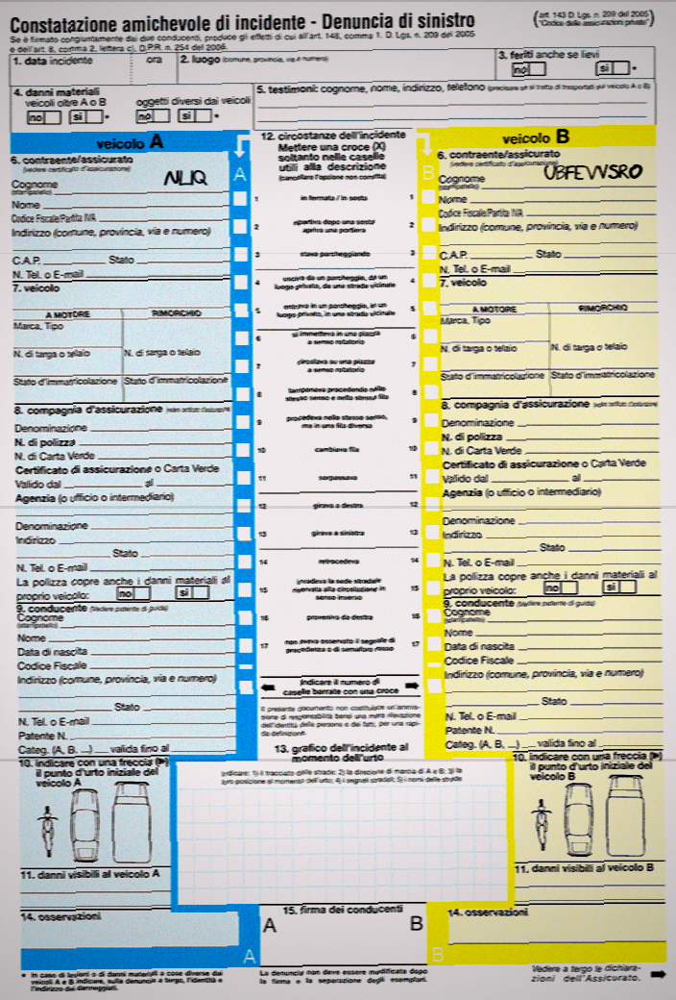

In [55]:
apply_scan_effect(img)